**Importing Necessary Libraries**

In [1]:
#For Data Manipulation and Mathematical Calculation
import pandas as pd
import numpy as np

#Visaulization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#Machine Learning
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC

#Deep Learning
import tensorflow as tf
from keras.models  import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Activation
from keras.layers import Input
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Model

#Model's Evaluation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('./train_100r.csv')

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0,1,18.382336,7.256714,91.377706,451.701127,0.078681,0.135853,0.290649,0.120906,...,26.770957,13.025038,116.746455,962.654199,0.118997,0.319514,0.783059,0.198664,0.529692,0.160792
1,1,0,10.302042,16.758441,97.568306,320.033091,0.129037,0.090188,0.043289,0.018798,...,13.444048,25.704716,96.355024,219.245739,0.157770,0.122358,0.022506,0.109841,0.279209,0.075751
2,2,0,8.045502,16.094636,78.540549,600.655293,0.077613,0.064573,0.007241,0.054136,...,16.217174,22.345908,112.749125,816.143560,0.110365,0.093854,0.411800,0.076750,0.343249,0.093198
3,3,0,11.064261,26.550410,67.836043,415.104126,0.116053,0.104673,0.094656,0.024589,...,30.842052,24.488840,109.580566,735.080454,0.119673,0.174270,0.062492,0.032425,0.361843,0.090056
4,4,1,6.892966,27.320674,155.892797,388.564447,0.116123,0.110978,0.122121,0.046933,...,31.950207,22.585051,89.875289,1392.646916,0.114831,0.166710,0.198205,0.180283,0.342547,0.105414


In [4]:
df.isna().sum()  #Checking for Null Values

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             1
concave points_mean        1
symmetry_mean              1
fractal_dimension_mean     1
radius_se                  1
texture_se                 1
perimeter_se               1
area_se                    1
smoothness_se              1
compactness_se             1
concavity_se               1
concave points_se          1
symmetry_se                1
fractal_dimension_se       1
radius_worst               1
texture_worst              1
perimeter_worst            1
area_worst                 1
smoothness_worst           1
compactness_worst          1
concavity_worst            1
concave points_worst       1
symmetry_worst             1
fractal_dimension_worst    1
dtype: int64

In [5]:
df.shape

(2879, 32)

In [6]:
#Overview of the Dataset and its Attributes

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2879 entries, 0 to 2878
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       2879 non-null   int64  
 1   diagnosis                2879 non-null   int64  
 2   radius_mean              2879 non-null   float64
 3   texture_mean             2879 non-null   float64
 4   perimeter_mean           2879 non-null   float64
 5   area_mean                2879 non-null   float64
 6   smoothness_mean          2879 non-null   float64
 7   compactness_mean         2879 non-null   float64
 8   concavity_mean           2878 non-null   float64
 9   concave points_mean      2878 non-null   float64
 10  symmetry_mean            2878 non-null   float64
 11  fractal_dimension_mean   2878 non-null   float64
 12  radius_se                2878 non-null   float64
 13  texture_se               2878 non-null   float64
 14  perimeter_se            

In [7]:
#Checking If Dataset is Imbalanced
from collections import Counter
c = Counter(df.diagnosis)

fig = px.bar(df ,x=[i[0] for i in c.items()],y =[i[1] for i in c.items()], color=[i[1] for i in c.items()], template = 'plotly_dark',height = 500,width = 700)
fig.update_layout(xaxis_title = 'Diagnosis', yaxis_title = 'Count',template = 'plotly_dark',title = 'Diagnosis Distribution')
fig.show()

In [8]:
df.diagnosis.value_counts()

1    1447
0    1432
Name: diagnosis, dtype: int64

***>> Dataset is Balanced***

### Checking for Skewness and Distribution

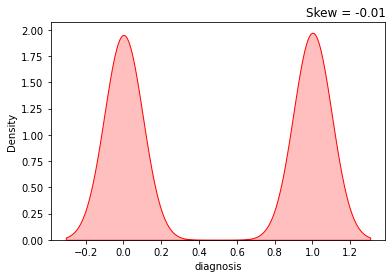

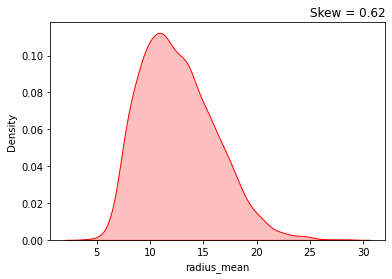

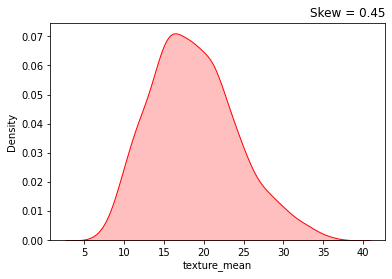

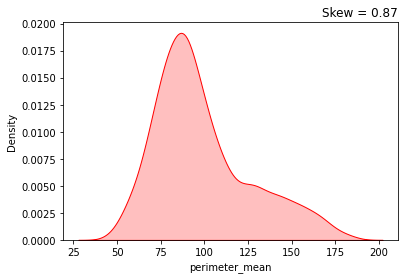

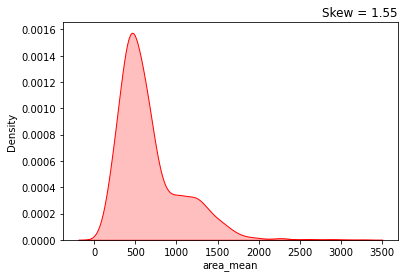

...

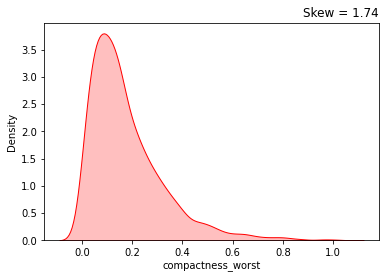

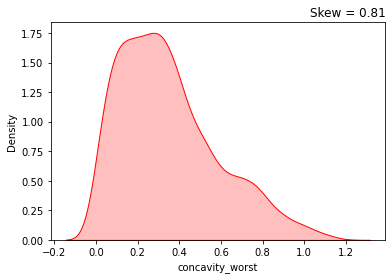

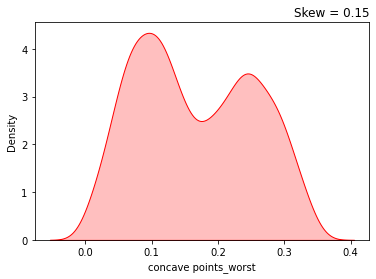

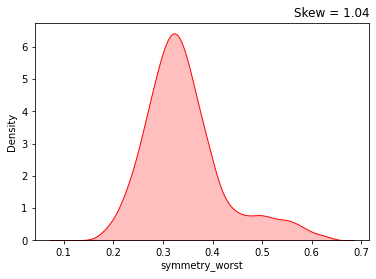

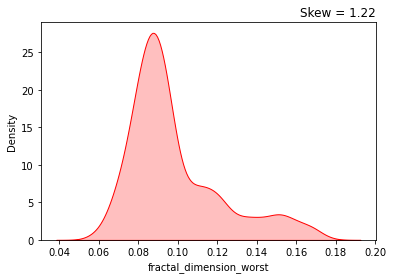

In [9]:
# #Skewness Before Treatement

for i in df.columns:
    if i != 'id':
        sns.kdeplot(df[i],color='r', shade=True)
        plt.title(f'Skew = {round(df[i].skew(),2)}',loc = 'right' )
        plt.show()

***There are Features which are Skewed*** 

***There are Various Techniques to deal with Skewed Attributes. We are going with Square Root Transformation***

***If the skewness is less than -1 or greater than 1, the data is highly skewed.***

In [10]:
#Double Square Root Transformation

for i in df.columns:
    if i!= 'id' and (df[i].skew() > 1 or df[i].skew()< -1):
        df[i] = np.sqrt(df[i])

for i in df.columns:
    if i!= 'id' and (df[i].skew() > 1 or df[i].skew()< -1):
        df[i] = np.sqrt(df[i])

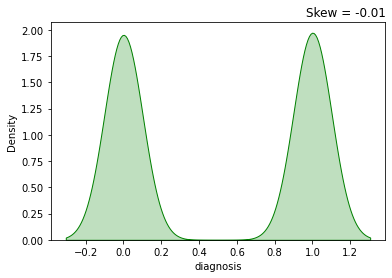

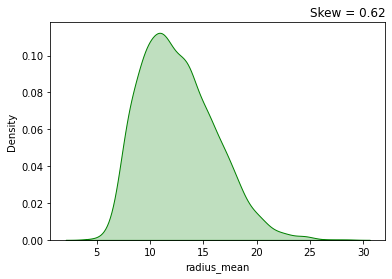

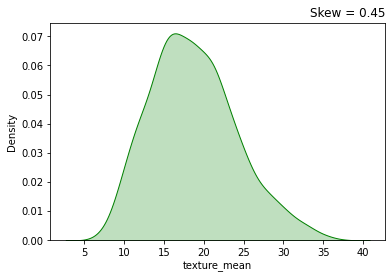

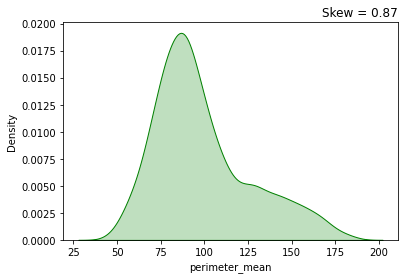

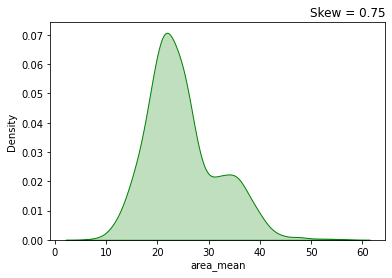

...

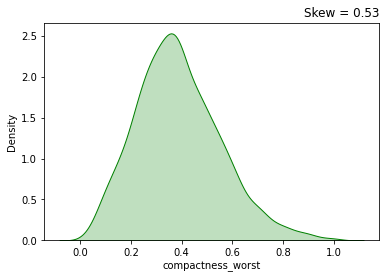

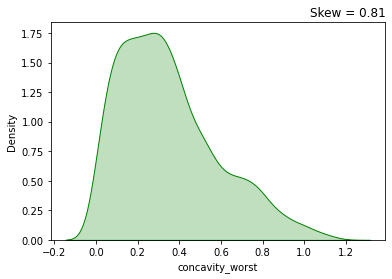

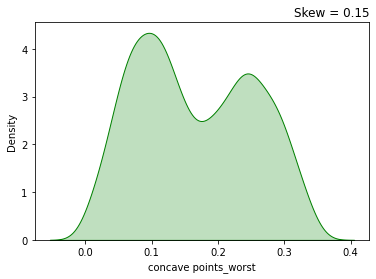

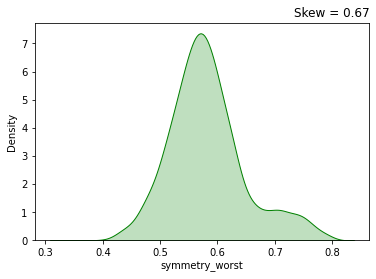

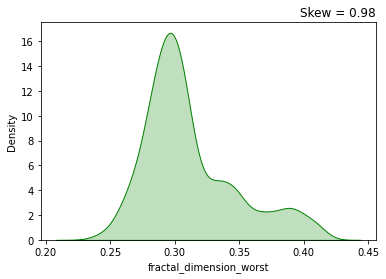

In [11]:
#Skewness After Treatement

for i in df.columns:
    if i != 'id':
        sns.kdeplot(df[i],color='g', shade=True)
        plt.title(f'Skew = {round(df[i].skew(),2)}',loc = 'right' )
        plt.show()

### Outliers Detection


In [12]:
id = df.id
df.drop('id',axis =1 ,inplace= True)

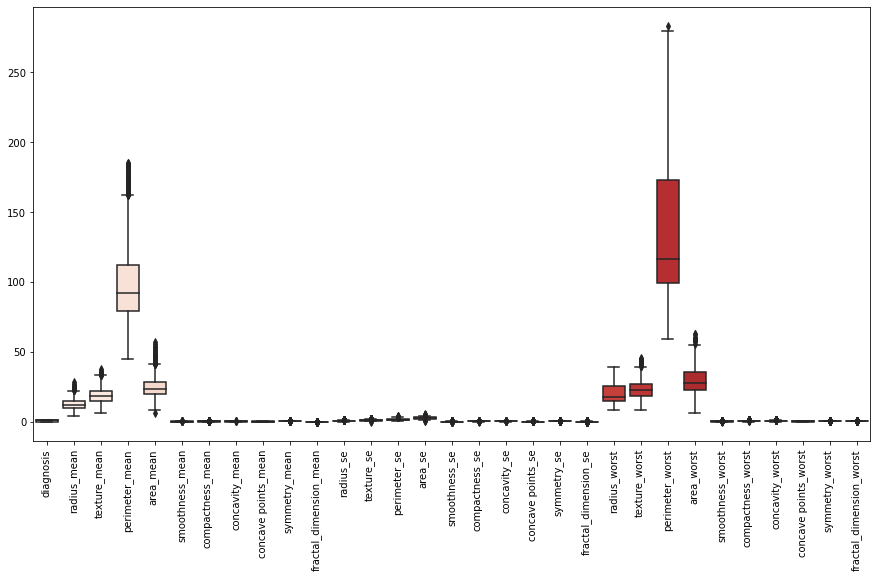

In [13]:
fig, ax = plt.subplots(figsize = (15,8))
sns.boxplot(data = df, ax = ax, palette='Reds') #Outliers Detection using Visualization Technique - Box Plots
plt.xticks(rotation = 90)
plt.show()

***From the above graphs we can see that there are outliers in some features***

***There are Various ways to treat the outliers, 1) IQR 2) Z-Score Elimination 3) Capping and Flooring...***

***We are going with Inter Quartile Range***

### Treating Outliers


In [14]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3-Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR
newdf = df[~((df < (lower)) | (df > (upper))).any(axis=1)]

In [15]:
print(f'Before treating outliers {df.shape[0]} <<|>> After treating outliers {newdf.shape[0]}')

Before treating outliers 2879 <<|>> After treating outliers 1827


## Distribution & Overview

In [16]:
means = [i for i in newdf.columns if i.endswith('_mean') or i.startswith('diagnosis')] #All the Mean Variables
se = [i for i in newdf.columns if i.endswith('_se') or i.startswith('diagnosis')] #All the se Variables
worst = [i for i in newdf.columns if i.endswith('_worst') or i.startswith('diagnosis')] #All the worst Variables

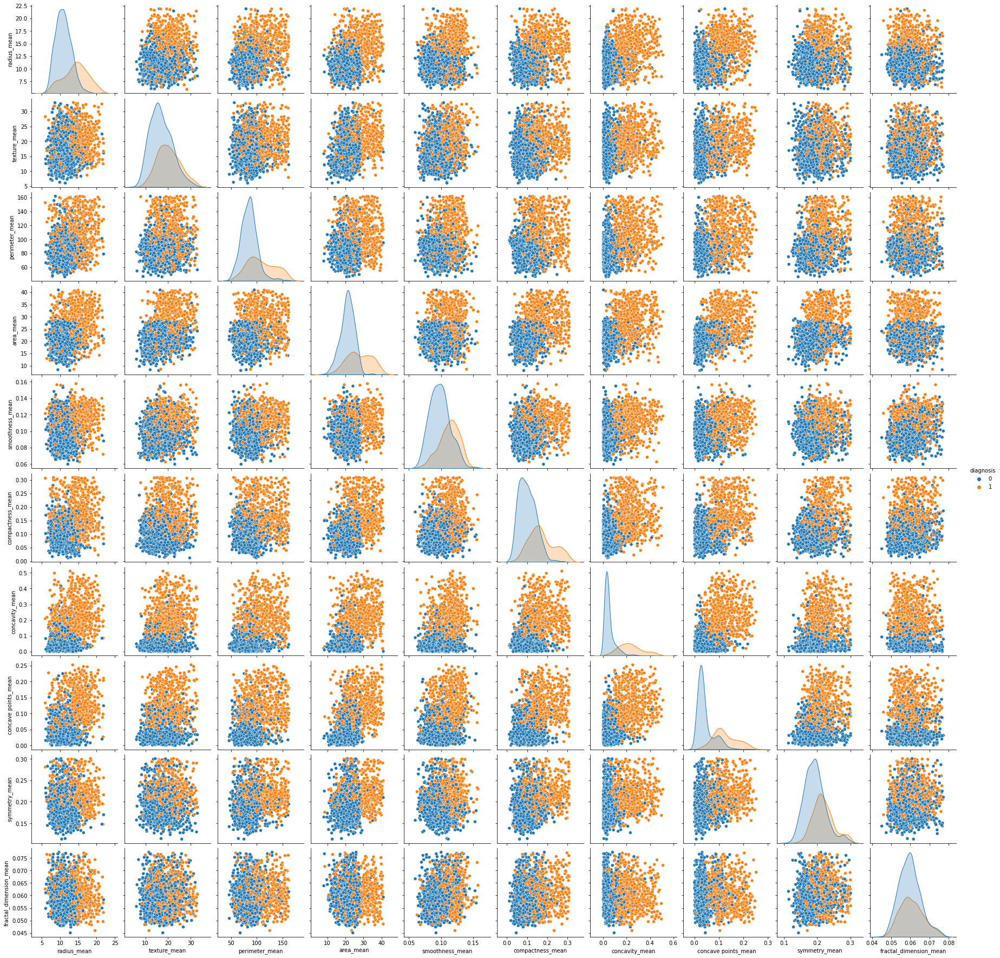

In [17]:
sns.pairplot(data = newdf[means],hue = 'diagnosis')

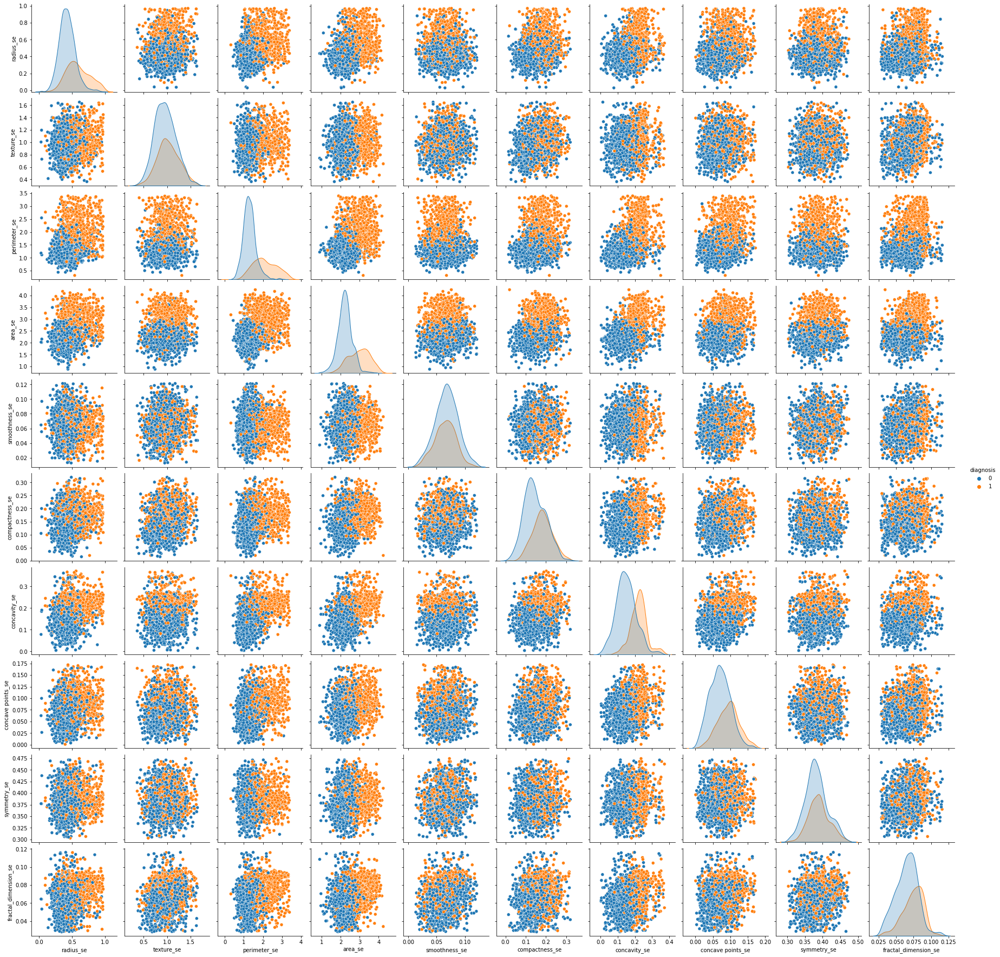

In [18]:
sns.pairplot(newdf[se],hue = "diagnosis")

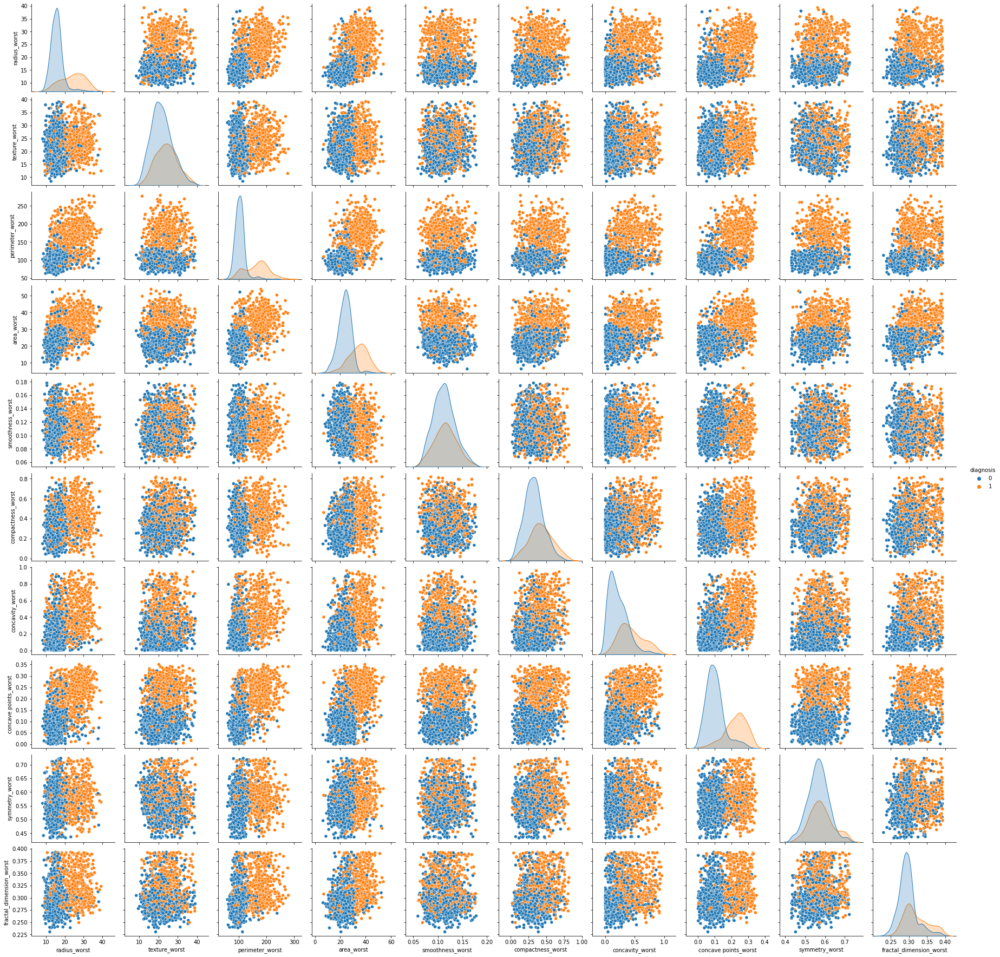

In [19]:
sns.pairplot(newdf[worst],hue = 'diagnosis')

***From the above graphs, we can observe that not all Features Datapoints are  lineraly seperable. Hence, Using Non Linear Models would be better in this particular usecase*** 

### Correlation Heatmap

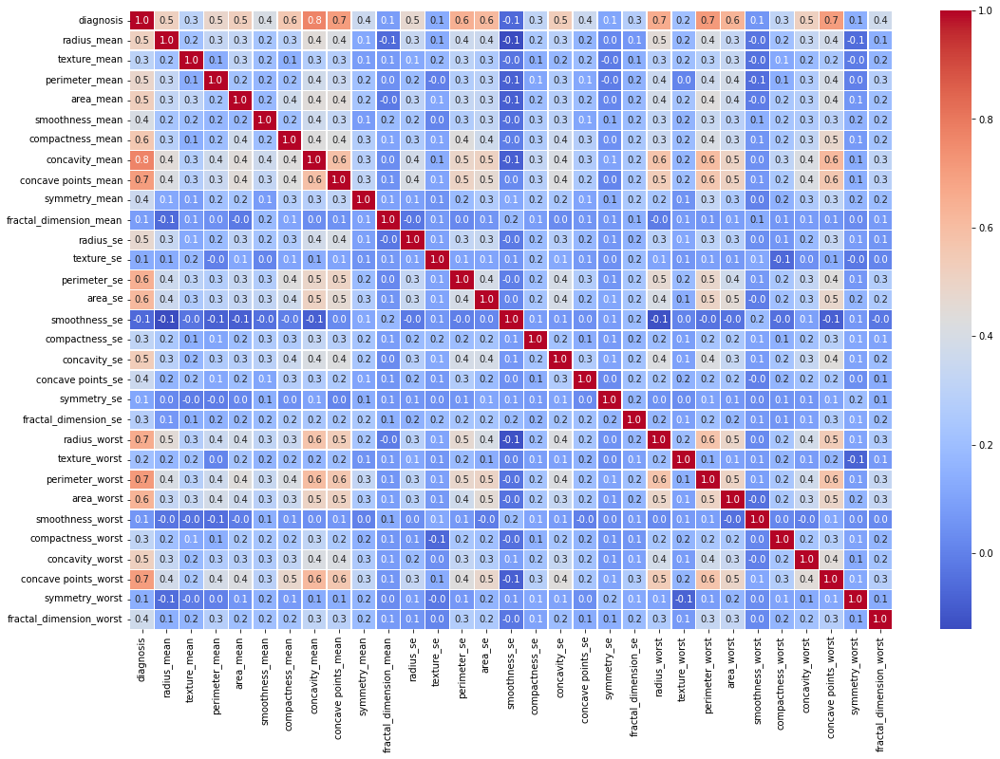

In [20]:
# Correlation by Heatmap
plt.figure(figsize = (18,12))
sns.heatmap(newdf.corr(), annot=True, linewidths=.5, fmt= '.1f',cmap='coolwarm')

***There are many features which are Highly Positively Correlated with the Target Variable.***

***Some of them are : area_mean, compactness_mean, concavity_mean, concave points_mean, perimeter_se, area_se, radius_worst, perimeter_worst, area_worst, concave points_worst***





### Standardization

In [21]:
diagnosis = newdf.diagnosis
newdf.drop('diagnosis',axis = 1,inplace=True) #No Standardization on the Dependent Variable

In [22]:
scaler = StandardScaler()
scaleddf = scaler.fit_transform(newdf) #Standardization 

In [23]:
newdf1 = pd.DataFrame(scaleddf,columns=newdf.columns) #Creating a Dataframe out of Standardized Array

## Feature Importance & Dimensionality Reduction

In [24]:
x = newdf1 #All the Independent Variables
y = diagnosis #Dependent Variable

Features Importance :  [0.01776631 0.         0.01155706 0.02891777 0.0032147  0.01870675
 0.35962275 0.08625425 0.00569454 0.00373724 0.01061634 0.0030342
 0.0278328  0.01614783 0.00241027 0.00100389 0.02287832 0.00538209
 0.00281595 0.00569997 0.06749997 0.00154037 0.10710362 0.05411096
 0.         0.         0.01366952 0.12173583 0.00104662 0.        ]


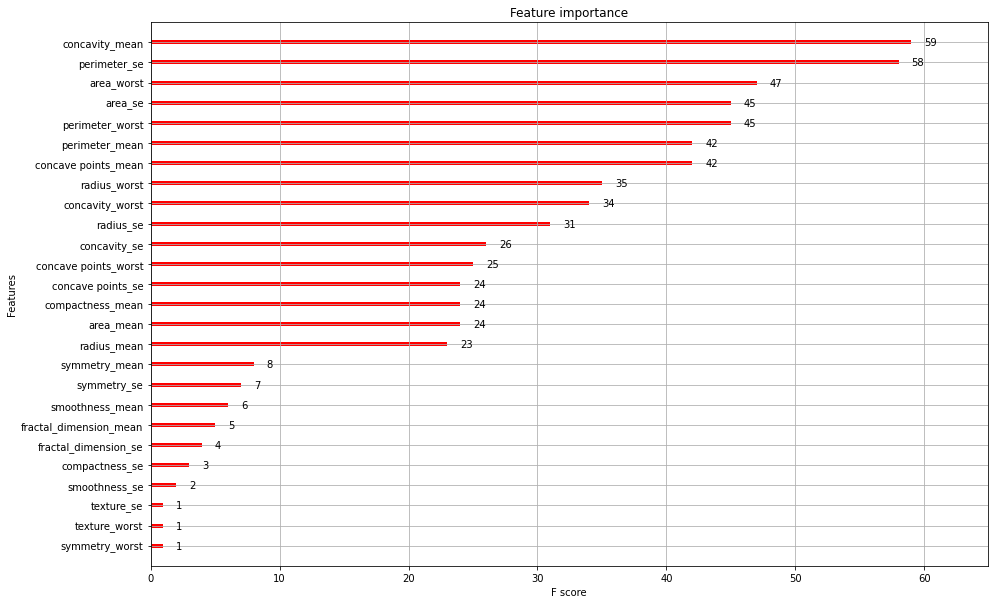

In [25]:
from xgboost import XGBClassifier
from xgboost import plot_importance

# fit model to training data
xgb_model = XGBClassifier(random_state = 0 )
xgb_model.fit(x, y)

print("Features Importance : ", xgb_model.feature_importances_)

# plot feature importance
fig,axes = plt.subplots(figsize = (15,10))
plot_importance(xgb_model,ax = axes,color = 'r')
plt.show()

In [26]:
importantFeatures = ['perimeter_worst','perimeter_se','perimeter_mean','concavity_mean','compactness_mean','area_se','concave points_mean','concave points_worst','area_worst','radius_se','radius_worst','area_mean','smoothness_se','symmetry_mean',"concavity_se",'concavity_worst','fractal_dimension_mean','smoothness_mean','radius_mean']

### Standardization

In [27]:
newdf = newdf[importantFeatures]

In [29]:
scaler = StandardScaler()
scaleddf1 = scaler.fit_transform(newdf) #Standardization 


In [31]:
newdf1 = pd.DataFrame(scaleddf1,columns=newdf.columns) #Creating a Dataframe out of Standardized Array

## Splitting The Data

In [32]:
newx = newdf1
newy = y

In [33]:
xtrain,xtest,ytrain,ytest = train_test_split(newx,newy,random_state=0,stratify=newy,test_size=0.3,shuffle=True)

## Model Building

In [34]:
#Lets define every model with multiple parameters for the selection of best model with best parameters.
#Hyper Parameter Space

model_params = {
    'logistic':{
        'model':LogisticRegression(),
        'params':{
            'penalty' : ['l1', 'l2', 'elasticnet'],
            'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
            
        }
    },
    'RF':{
        'model':RandomForestClassifier(n_jobs = -1),
        'params':{
            'n_estimators':[10,50,100,150],
            'criterion' : ["gini", "entropy"]
            
        }
    },
    'DT':{
        'model':DecisionTreeClassifier(),
        'params':{
            'criterion' : ["gini", "entropy"],
            'splitter':["best", "random"]
        }
        
    },
    'XGBC':{
        'model': XGBClassifier(n_jobs = -1,tree_method = 'gpu_hist'),
        'params':{
            'n_estimators': [400, 700, 1000],
            'colsample_bytree': [0.7, 0.8],
            'max_depth': [15,20,25],
            'reg_alpha': [1.1, 1.2, 1.3],
            'reg_lambda': [1.1, 1.2, 1.3],
            'subsample': [0.7, 0.8, 0.9]
        },
    }
}

## Randomized Search CV

In [ ]:
scores = [] #List containing all the best scores
for model_name, modelp in model_params.items():
    clf = RandomizedSearchCV(modelp['model'],modelp['params'],cv = 5,return_train_score=False,verbose=True)
    clf.fit(newx,newy)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
scoreddf = pd.DataFrame(scores,columns=['model','best_score','best_params'])
scoreddf

## XGB Classifier

In [35]:
#Using the Best Parameters from RSCV
model = XGBClassifier(subsample = 0.9,
  reg_lambda =  1.2,
  reg_alpha = 1.2,
  n_estimators =  700,
  max_depth = 15,
  colsample_bytree = 0.8,tree_method = 'gpu_hist')
model.fit(xtrain,ytrain)


XGBClassifier(colsample_bytree=0.8, max_depth=15, n_estimators=700,
              reg_alpha=1.2, reg_lambda=1.2, subsample=0.9,
              tree_method='gpu_hist')

In [36]:
print(f' Training Accuracy - {(accuracy_score(ytrain,model.predict(xtrain)))*100}%')

 Training Accuracy - 100.0%


In [37]:
predicted = model.predict(xtest)

In [38]:
print(f' Testing Accuracy - {round((accuracy_score(ytest,predicted))*100,2)}%')

 Testing Accuracy - 97.81%


## Models Evaluation


***CONFUSION MATRIX***

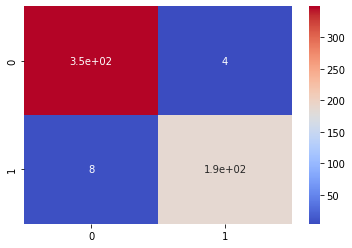

In [39]:
matrix = confusion_matrix(ytest,predicted)
sns.heatmap(matrix,cmap = 'coolwarm',annot=True)

 ***ROC AUC SCORE AND CURVE***

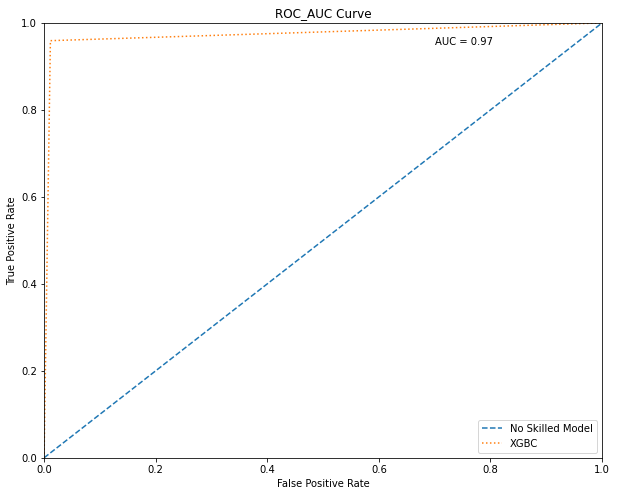

In [40]:
falsep,truep,thresholds = roc_curve(ytest,predicted)
auc = roc_auc_score(ytest,predicted)
ns_probs = [0 for _ in range(len(ytest))]
ns_fpr, ns_tpr, _ = roc_curve(ytest, ns_probs)
plt.figure(figsize = (10,8))
plt.xlim([0,1])
plt.ylim([0,1])
plt.text(0.7,0.95,f"AUC = {round(auc,2)}")
plt.title('ROC_AUC Curve')
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skilled Model')
plt.plot(falsep,truep,linestyle=':',label = "XGBC")
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

***CLASSIFICATION REPORT***

In [41]:
print(classification_report(ytest, predicted))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       353
           1       0.98      0.96      0.97       196

    accuracy                           0.98       549
   macro avg       0.98      0.97      0.98       549
weighted avg       0.98      0.98      0.98       549



***Model is Performing Well!!***

## Test Data Manipulation

In [42]:
testdf = pd.read_csv('./test_100r.csv')

In [43]:
testdf.isna().sum() #Checking for Null Values

id                         58
radius_mean                58
texture_mean               58
perimeter_mean             58
area_mean                  58
smoothness_mean            58
compactness_mean           58
concavity_mean             58
concave points_mean        58
symmetry_mean              58
fractal_dimension_mean     58
radius_se                  58
texture_se                 58
perimeter_se               58
area_se                    58
smoothness_se              58
compactness_se             58
concavity_se               58
concave points_se          58
symmetry_se                58
fractal_dimension_se       58
radius_worst               58
texture_worst              58
perimeter_worst            58
area_worst                 58
smoothness_worst           58
compactness_worst          58
concavity_worst            58
concave points_worst       58
symmetry_worst             58
fractal_dimension_worst    58
dtype: int64

In [44]:
testdf.dropna(inplace=True,axis = 0) #Dropping Null Values

In [45]:
testid = testdf.id

In [46]:
testdf.drop('id',axis =1, inplace = True) #Droping the ID Variable

In [47]:
testdf = testdf[importantFeatures]

In [48]:
scaledtest = scaler.transform(testdf) #Standardizing the Test Dataset

In [49]:
finaltest = pd.DataFrame(scaledtest,columns = testdf.columns) #Creating New Dataframe

In [50]:
predicted = model.predict(finaltest) #Making Predictions

In [51]:
predicted

array([0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1])

In [52]:
result = []
for item in predicted:
    if item==0:
        result.append("Benign")
    elif item==1:
        result.append("Malignant")

In [53]:
submission = pd.DataFrame(result, columns = ['diagnosis'])
result_new = pd.concat([testid, submission], axis=1)
print(submission)

    diagnosis
0      Benign
1      Benign
2   Malignant
3   Malignant
4   Malignant
..        ...
95     Benign
96     Benign
97     Benign
98  Malignant
99  Malignant

[100 rows x 1 columns]


In [54]:
result_new.to_csv('BreastCancerClassification2.csv', index=False)

In [55]:
result_new

,id,diagnosis
0,0.0,Benign
1,1.0,Benign
2,2.0,Malignant
3,3.0,Malignant
4,4.0,Malignant
...,...,...
95,95.0,Benign
96,96.0,Benign
97,97.0,Benign
98,98.0,Malignant


# Deep Learning


In [ ]:
x = newdf1  #All the Independent Variables
y = newy #Dependent Variables

In [ ]:
newdf = newdf1[['perimeter_worst','perimeter_se','perimeter_mean','concavity_mean','compactness_mean','area_se','concave points_mean','concave points_worst','area_worst','radius_se','radius_worst','area_mean','smoothness_se','symmetry_mean',"concavity_se",'concavity_worst','fractal_dimension_mean','smoothness_mean','radius_mean']] #Important Features Extracted from Machine Learning Technique.

## **Train Test Split**

In [ ]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,random_state=0,test_size=0.3,stratify=y,shuffle=True)

# **Model Building**

In [ ]:
#3 Layered ANN

def create_model(optimizer,activation):
    i = Input(shape=xtrain.shape[1]) #Input Layer
    x = Dense(100,Activation(activation)) (i) #Hidden Layer 1
    x = Dropout(0.4)(x) #Regularization Method to avoid Overfitting
    x = Dense(150,Activation(activation)) (x) #Hidden Layer 2
    x = Dropout(0.4)(x)
    x = Dense(170,Activation(activation))(x) #Hidden Layer 3
    x = Dropout(0.4)(x)
    x = Dense(1, activation="sigmoid")(x) #Output Layer
    model = Model(i, x) 
    model.compile(optimizer=optimizer, loss='binary_crossentropy',metrics=['accuracy'],) #Compilation and Backward Propogation
    return model

#Model Wrapping (To use Sci-Kit Learn Functions)      
model = KerasClassifier(build_fn=create_model, verbose=0)

#Hyper Parameter Space
activations = ['sigmoid', 'relu']
optimizers = ['adam','rmsprop','adagrad']
param_grid = dict(optimizer = optimizers, activation=activations, batch_size = [128, 256], epochs=[10,20,30,50]) #Dictionary of all the hyperparameters.

#Randomized Search CV
grid = RandomizedSearchCV(estimator=model, param_distributions=param_grid,cv = 5)

grid_result = grid.fit(xtrain, ytrain) #Fitting the data

print([grid_result.best_score_,grid_result.best_params_])  #Best Parameters & Score

pred_y = grid.predict(xtest) #Predictions



[0.9847371101379394, {'optimizer': 'adam', 'epochs': 30, 'batch_size': 256, 'activation': 'relu'}]







# **Models Evaluation**

*Confusion Matrix*

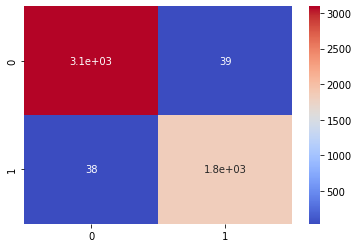

In [ ]:
matrix = confusion_matrix(ytest,pred_y)
sns.heatmap(matrix,cmap = 'coolwarm',annot=True)




*Classification Report*

In [ ]:
print(classification_report(ytest, pred_y))
 

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3132
           1       0.98      0.98      0.98      1867

    accuracy                           0.98      4999
   macro avg       0.98      0.98      0.98      4999
weighted avg       0.98      0.98      0.98      4999



*ROC - AUC Curve & Score*

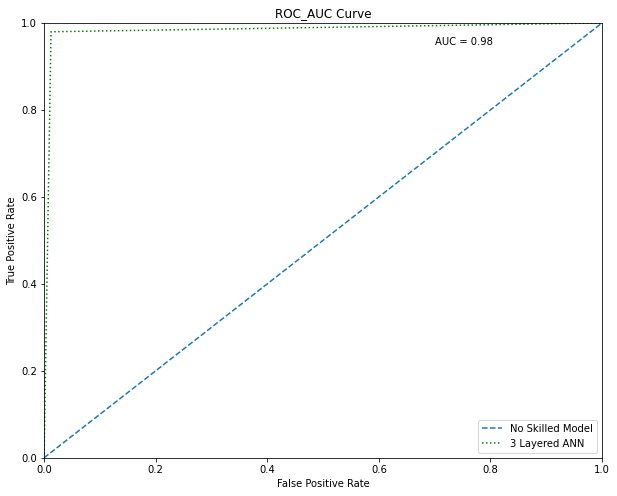

In [ ]:
falsep,truep,thresholds = roc_curve(ytest,pred_y)
auc = roc_auc_score(ytest,pred_y)
ns_probs = [0 for _ in range(len(ytest))]
ns_fpr, ns_tpr, _ = roc_curve(ytest, ns_probs)
plt.figure(figsize = (10,8))
plt.xlim([0,1])
plt.ylim([0,1])
plt.text(0.7,0.95,f"AUC = {round(auc,2)}")
plt.title('ROC_AUC Curve')
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skilled Model')
plt.plot(falsep,truep,linestyle=':',label = "3 Layered ANN",color = 'g')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

In [ ]:
## Multi Layered ANN (Deep & Optimal Network )

def optimalModel(layers, activation, optimizer):
    model = Sequential()
    for i, neurons in enumerate(layers):
        if i==0: #Input layer
            model.add(Dense(neurons,input_dim=xtrain.shape[1]))
            model.add(Activation(activation))
            model.add(Dropout(0.4)) #Regularization method to avoid overfitting
        else:
            model.add(Dense(neurons)) #Hidden Layers
            model.add(Activation(activation))
            model.add(Dropout(0.4))
    model.add(Dense(1)) #Output Layer
    model.add(Activation('sigmoid')) 
    
    model.compile(optimizer=optimizer, loss='binary_crossentropy',metrics=['accuracy'])
    return model

#Model Wrapping (To use Sci-Kit Learn Functions)      
model = KerasClassifier(build_fn=optimalModel, verbose=0)

#Hyper Parameter Space
activations = ['sigmoid', 'relu']
optimizers = ['adam','rmsprop','sgd']
layers = [[100], [100, 150], [100, 150, 170], [100,150,170,200], [100,120,150,170,200],[100,120,150,170,200,250]] #Layers Parameter List of List for finding optimal number of layers.
param_grid = dict(layers = layers, optimizer = optimizers, activation=activations, batch_size = [128, 256], epochs=[10,20,30,50])

#Randomized Search CV
gridmulti = RandomizedSearchCV(estimator=model, param_distributions=param_grid,cv = 5) 

grid_result_multi = gridmulti.fit(xtrain, ytrain) #Fitting the data

print([grid_result_multi.best_score_,grid_result_multi.best_params_])  #Best Parameters & Score

predicted = gridmulti.predict(xtest) #Predictions



[0.9842224478721618, {'optimizer': 'adam', 'layers': [100, 120, 150, 170, 200], 'epochs': 30, 'batch_size': 256, 'activation': 'relu'}]



# **Models Evaluation**

*Confusion Matrix*

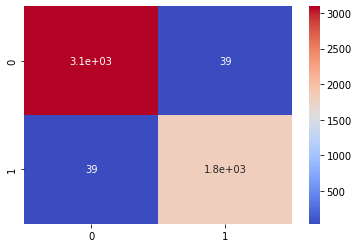

In [ ]:
matrix = confusion_matrix(ytest,predicted)
sns.heatmap(matrix,cmap = 'coolwarm',annot=True)

*Classification Report*

In [ ]:
print(classification_report(ytest, predicted))
 

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3132
           1       0.98      0.98      0.98      1867

    accuracy                           0.98      4999
   macro avg       0.98      0.98      0.98      4999
weighted avg       0.98      0.98      0.98      4999



*ROC-AUC Curve & Score*

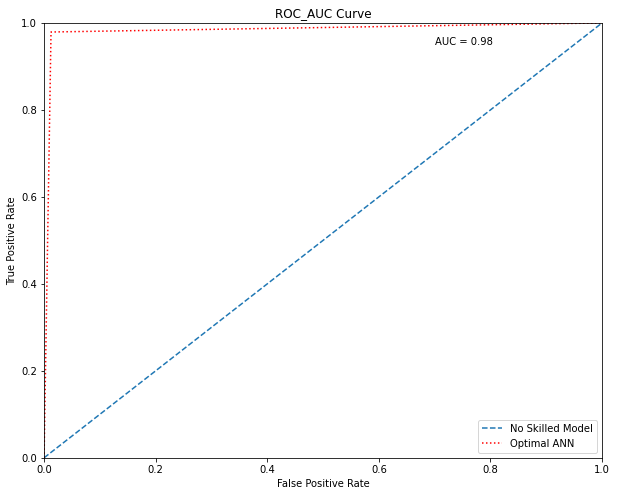

In [ ]:
falsep,truep,thresholds = roc_curve(ytest,predicted)
auc = roc_auc_score(ytest,predicted)
ns_probs = [0 for _ in range(len(ytest))]
ns_fpr, ns_tpr, _ = roc_curve(ytest, ns_probs)
plt.figure(figsize = (10,8))
plt.xlim([0,1])
plt.ylim([0,1])
plt.text(0.7,0.95,f"AUC = {round(auc,2)}")
plt.title('ROC_AUC Curve')
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skilled Model')
plt.plot(falsep,truep,linestyle=':',label = "Optimal ANN",color = 'r')
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

*Comparision*

In [ ]:
print(f'Accuracy of 3 Layered ANN == {round(accuracy_score(ytest,pred_y),2)}% <<>> Accuracy of the Differently Architectured ANN == {round(accuracy_score(ytest,predicted),2)}%')

Accuracy of 3 Layered ANN == 0.98% <<>> Accuracy of the Differently Architectured ANN == 0.98%


## *Test Data Predictions*

In [ ]:
testdf = pd.read_csv('/testFinal.csv')

In [ ]:
scaler = StandardScaler() #Standardizing the Test Dataset
scaleddf = scaler.fit_transform(testdf)
testdf = pd.DataFrame(scaleddf, columns = testdf.columns) #Creating the DataFrame out of the scaled numpy array

In [ ]:
testdf.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,-0.308400,-1.487978,-1.222252,-1.298598,-1.998938,-0.243879,-1.038830,-1.054599,-0.210579,-0.785754,...,-1.320139,-1.802007,-1.029658,-1.645708,-1.055819,-0.894205,-0.182909,-1.266871,0.054408,-0.987091
1,-1.730666,-0.425297,-0.292335,-0.640079,-0.621299,-1.337613,-1.150897,-1.334297,-0.805750,-0.505211,...,-0.459994,-0.375958,-0.712118,-0.242543,-1.614080,0.111690,0.719007,-0.637167,0.609947,-0.017316
2,-0.408561,0.452682,0.265040,1.597472,-0.061800,2.382894,2.405487,1.596709,0.245450,-0.151742,...,-1.228659,-0.669792,-0.558375,0.446130,-1.276894,-0.956244,0.415891,0.694111,1.920599,-0.203332
3,1.210896,-0.175130,0.798469,0.891177,1.486063,-0.745449,-0.680552,-0.042276,1.042587,0.782373,...,-0.613095,0.275036,-0.900948,0.031941,-0.350688,3.491790,-0.347557,-1.324230,-0.929819,-0.651867
4,-0.633435,-0.223992,-0.349017,1.085078,0.018158,0.629340,1.559374,-0.577046,0.724724,-0.333022,...,-0.605798,-0.419549,-0.429124,-0.523716,3.105686,0.036125,0.789981,0.066940,2.782394,-0.295851


*Making Predictions from the Optimal Layered ANN*

In [ ]:
testpredicted = gridmulti.predict(testdf[['perimeter_worst','perimeter_se','perimeter_mean','concavity_mean','compactness_mean','area_se','concave points_mean','concave points_worst','area_worst','radius_se','radius_worst','area_mean','smoothness_se','symmetry_mean',"concavity_se",'concavity_worst','fractal_dimension_mean','smoothness_mean','radius_mean']])

In [ ]:
result = []
for item in testpredicted:
    if item==0:
        result.append("Benign")
    elif item==1:
        result.append("Malignant")

In [ ]:
id = pd.Series([float(i) for i in range(0,100)]) #Creating ID Column

In [ ]:
submission = pd.DataFrame(result, columns = ['diagnosis'])
result_new = pd.concat([id, submission], axis=1)
print(submission)

    diagnosis
0      Benign
1      Benign
2   Malignant
3   Malignant
4   Malignant
..        ...
95     Benign
96     Benign
97     Benign
98  Malignant
99  Malignant

[100 rows x 1 columns]


In [ ]:
result_new.to_csv('BreastCancerClassificationDL.csv', index=False)